In [2]:
from google.colab import drive
import numpy as np
from pathlib import Path

# Mount Drive
drive.mount('/content/drive')

# Set paths
base_path = Path('/content/drive/MyDrive/Crack_tracking')
data_path = base_path / 'data' / '1508 20250613 105 kx Ceta Camera.npy'
annotation_path = base_path / 'annotations'

# Load annotations
sample_name = "1508_20250613_105_kx_Ceta_Camera"

masks = np.load(annotation_path / f'{sample_name}_annotated_masks.npy')
frame_indices = np.load(annotation_path / f'{sample_name}_frame_indices.npy')

print("✅ Successfully loaded annotations!")
print(f"   Masks shape: {masks.shape}")
print(f"   Number of annotated frames: {len(frame_indices)}")
print(f"   Frame indices: {frame_indices[:5]}...{frame_indices[-5:]}")
print(f"   Total annotated pixels: {masks.sum():,}")

# Load original frames
frames = np.load(data_path, mmap_mode='r')
print(f"\n✅ Original data loaded!")
print(f"   Total frames: {frames.shape[0]}")
print(f"   Frame size: {frames.shape[1]} x {frames.shape[2]}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Successfully loaded annotations!
   Masks shape: (53, 1024, 1024)
   Number of annotated frames: 53
   Frame indices: [ 0 20 40 60 80]...[760 780 800 820 840]
   Total annotated pixels: 57,954

✅ Original data loaded!
   Total frames: 855
   Frame size: 1024 x 1024


In [3]:
from sklearn.model_selection import train_test_split

# Split: 70% train, 15% validation, 15% test
train_idx, temp_idx = train_test_split(
    np.arange(len(masks)),
    test_size=0.3,
    random_state=42
)

val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    random_state=42
)

print(f"Dataset split:")
print(f"  Training: {len(train_idx)} frames ({len(train_idx)/len(masks)*100:.1f}%)")
print(f"  Validation: {len(val_idx)} frames ({len(val_idx)/len(masks)*100:.1f}%)")
print(f"  Test: {len(test_idx)} frames ({len(test_idx)/len(masks)*100:.1f}%)")

# Save split for reproducibility
np.save(annotation_path / f'{sample_name}_train_idx.npy', train_idx)
np.save(annotation_path / f'{sample_name}_val_idx.npy', val_idx)
np.save(annotation_path / f'{sample_name}_test_idx.npy', test_idx)

print("\n✅ Train/val/test split saved!")

Dataset split:
  Training: 37 frames (69.8%)
  Validation: 8 frames (15.1%)
  Test: 8 frames (15.1%)

✅ Train/val/test split saved!


In [12]:
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

class CrackDataset(Dataset):
    """Dataset for crack segmentation"""

    def __init__(self, frames, masks, frame_indices, indices, transform=None):
        """
        Args:
            frames: Full frame array (memory-mapped)
            masks: Annotated masks
            frame_indices: Which frames were annotated
            indices: Train/val/test split indices
            transform: Augmentation pipeline
        """
        self.frames = frames
        self.masks = masks[indices]
        self.frame_indices = frame_indices[indices]
        self.transform = transform

    def __len__(self):
        return len(self.masks)

    def __getitem__(self, idx):
        # Get frame and mask
        frame_num = self.frame_indices[idx]
        image = self.frames[frame_num].astype(np.float32)
        mask = self.masks[idx].astype(np.float32)

        # Normalize image to [0, 1]
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)

        # Add channel dimension for grayscale
        image = np.expand_dims(image, axis=-1)
        mask = np.expand_dims(mask, axis=-1)

        # Apply augmentations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # Ensure mask is C, H, W format after ToTensorV2 converts (H, W, C) numpy to (H, W, C) torch
        if isinstance(mask, torch.Tensor) and mask.ndim == 3 and mask.shape[-1] == 1:
            mask = mask.permute(2, 0, 1) # Convert H, W, C to C, H, W

        return image, mask

# Define augmentations
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
    ToTensorV2(),
])

val_transform = A.Compose([
    ToTensorV2(),
])

# Create datasets
train_dataset = CrackDataset(frames, masks, frame_indices, train_idx, transform=train_transform)
val_dataset = CrackDataset(frames, masks, frame_indices, val_idx, transform=val_transform)
test_dataset = CrackDataset(frames, masks, frame_indices, test_idx, transform=val_transform)

# Create dataloaders
batch_size = 4  # Adjust based on GPU memory

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"✅ Datasets created!")
print(f"   Training batches: {len(train_loader)}")
print(f"   Validation batches: {len(val_loader)}")
print(f"   Test batches: {len(test_loader)}")

✅ Datasets created!
   Training batches: 10
   Validation batches: 2
   Test batches: 2


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-3536098089.py:58: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


In [7]:
# Install deep learning packages
!pip install torch torchvision segmentation-models-pytorch albumentations tqdm

import segmentation_models_pytorch as smp

# Create U-Net model with pretrained encoder
model = smp.Unet(
    encoder_name="resnet34",        # Pretrained encoder
    encoder_weights="imagenet",     # Use ImageNet pretrained weights
    in_channels=1,                  # Grayscale input
    classes=1,                      # Binary segmentation
    activation=None,                # We'll use sigmoid in loss
)

# Move to GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

print(f"✅ Model created!")
print(f"   Parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"   Device: {device}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.3 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

✅ Model created!
   Parameters: 24,430,097
   Device: cuda


In [9]:
import torch.nn as nn

class DiceBCELoss(nn.Module):
    """Combined Dice Loss and Binary Cross Entropy"""

    def __init__(self, weight_dice=0.5, weight_bce=0.5):
        super().__init__()
        self.weight_dice = weight_dice
        self.weight_bce = weight_bce
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, inputs, targets):
        # BCE loss
        bce_loss = self.bce(inputs, targets)

        # Dice loss
        inputs_sigmoid = torch.sigmoid(inputs)
        smooth = 1e-5

        intersection = (inputs_sigmoid * targets).sum(dim=(2, 3))
        union = inputs_sigmoid.sum(dim=(2, 3)) + targets.sum(dim=(2, 3))
        dice = (2. * intersection + smooth) / (union + smooth)
        dice_loss = 1 - dice.mean()

        # Combined loss
        return self.weight_bce * bce_loss + self.weight_dice * dice_loss

# Loss and optimizer
criterion = DiceBCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', patience=5, factor=0.5
)

print("✅ Loss function and optimizer ready!")

✅ Loss function and optimizer ready!


In [10]:
from tqdm.notebook import tqdm

def calculate_iou(pred, target, threshold=0.5):
    """Calculate Intersection over Union"""
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()

def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    total_loss = 0
    total_iou = 0

    pbar = tqdm(loader, desc="Training")
    for images, masks in pbar:
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Metrics
        total_loss += loss.item()
        with torch.no_grad():
            iou = calculate_iou(torch.sigmoid(outputs), masks)
            total_iou += iou

        pbar.set_postfix({'loss': f'{loss.item():.4f}', 'iou': f'{iou:.4f}'})

    return total_loss / len(loader), total_iou / len(loader)

def validate(model, loader, criterion, device):
    """Validate model"""
    model.eval()
    total_loss = 0
    total_iou = 0

    with torch.no_grad():
        pbar = tqdm(loader, desc="Validation")
        for images, masks in pbar:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()
            iou = calculate_iou(torch.sigmoid(outputs), masks)
            total_iou += iou

            pbar.set_postfix({'loss': f'{loss.item():.4f}', 'iou': f'{iou:.4f}'})

    return total_loss / len(loader), total_iou / len(loader)

print("✅ Training functions ready!")

✅ Training functions ready!


In [13]:
# Training configuration
num_epochs = 50
best_val_iou = 0

# Results path
results_path = base_path / 'results'
results_path.mkdir(exist_ok=True)

# Training history
history = {
    'train_loss': [],
    'train_iou': [],
    'val_loss': [],
    'val_iou': []
}

print("🚀 Starting training...")
print("="*60)

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print("-" * 60)

    # Train
    train_loss, train_iou = train_epoch(model, train_loader, criterion, optimizer, device)

    # Validate
    val_loss, val_iou = validate(model, val_loader, criterion, device)

    # Update scheduler
    scheduler.step(val_loss)

    # Save history
    history['train_loss'].append(train_loss)
    history['train_iou'].append(train_iou)
    history['val_loss'].append(val_loss)
    history['val_iou'].append(val_iou)

    # Print epoch summary
    print(f"\nEpoch {epoch+1} Summary:")
    print(f"  Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
    print(f"  Val Loss:   {val_loss:.4f}, Val IoU:   {val_iou:.4f}")

    # Save best model
    if val_iou > best_val_iou:
        best_val_iou = val_iou
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_iou': val_iou,
            'val_loss': val_loss
        }, results_path / f'{sample_name}_best_model.pth')
        print(f"  ✅ New best model saved! (IoU: {val_iou:.4f})")

print("\n" + "="*60)
print(f"✅ Training complete!")
print(f"   Best validation IoU: {best_val_iou:.4f}")

🚀 Starting training...

Epoch 1/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 1 Summary:
  Train Loss: 0.6558, Train IoU: 0.0012
  Val Loss:   0.7238, Val IoU:   0.0013
  ✅ New best model saved! (IoU: 0.0013)

Epoch 2/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 2 Summary:
  Train Loss: 0.6374, Train IoU: 0.0008
  Val Loss:   0.6574, Val IoU:   0.0005

Epoch 3/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 3 Summary:
  Train Loss: 0.6187, Train IoU: 0.0002
  Val Loss:   0.6073, Val IoU:   0.0000

Epoch 4/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 4 Summary:
  Train Loss: 0.6023, Train IoU: 0.0000
  Val Loss:   0.5810, Val IoU:   0.0000

Epoch 5/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 5 Summary:
  Train Loss: 0.5906, Train IoU: 0.0000
  Val Loss:   0.5721, Val IoU:   0.0000

Epoch 6/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 6 Summary:
  Train Loss: 0.5816, Train IoU: 0.0000
  Val Loss:   0.5669, Val IoU:   0.0000

Epoch 7/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 7 Summary:
  Train Loss: 0.5747, Train IoU: 0.0000
  Val Loss:   0.5659, Val IoU:   0.0000

Epoch 8/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 8 Summary:
  Train Loss: 0.5686, Train IoU: 0.0000
  Val Loss:   0.5645, Val IoU:   0.0000

Epoch 9/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 9 Summary:
  Train Loss: 0.5636, Train IoU: 0.0000
  Val Loss:   0.5619, Val IoU:   0.0000

Epoch 10/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 10 Summary:
  Train Loss: 0.5591, Train IoU: 0.0000
  Val Loss:   0.5580, Val IoU:   0.0000

Epoch 11/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 11 Summary:
  Train Loss: 0.5552, Train IoU: 0.0010
  Val Loss:   0.5554, Val IoU:   0.0000

Epoch 12/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 12 Summary:
  Train Loss: 0.5514, Train IoU: 0.0043
  Val Loss:   0.5527, Val IoU:   0.0000

Epoch 13/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 13 Summary:
  Train Loss: 0.5482, Train IoU: 0.0382
  Val Loss:   0.5488, Val IoU:   0.0138
  ✅ New best model saved! (IoU: 0.0138)

Epoch 14/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 14 Summary:
  Train Loss: 0.5455, Train IoU: 0.1154
  Val Loss:   0.5479, Val IoU:   0.0000

Epoch 15/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 15 Summary:
  Train Loss: 0.5425, Train IoU: 0.1580
  Val Loss:   0.5459, Val IoU:   0.0607
  ✅ New best model saved! (IoU: 0.0607)

Epoch 16/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 16 Summary:
  Train Loss: 0.5389, Train IoU: 0.1768
  Val Loss:   0.5394, Val IoU:   0.0454

Epoch 17/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 17 Summary:
  Train Loss: 0.5362, Train IoU: 0.1675
  Val Loss:   0.5339, Val IoU:   0.2124
  ✅ New best model saved! (IoU: 0.2124)

Epoch 18/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 18 Summary:
  Train Loss: 0.5329, Train IoU: 0.1717
  Val Loss:   0.5312, Val IoU:   0.2177
  ✅ New best model saved! (IoU: 0.2177)

Epoch 19/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 19 Summary:
  Train Loss: 0.5307, Train IoU: 0.1833
  Val Loss:   0.5285, Val IoU:   0.1737

Epoch 20/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 20 Summary:
  Train Loss: 0.5283, Train IoU: 0.1861
  Val Loss:   0.5282, Val IoU:   0.2608
  ✅ New best model saved! (IoU: 0.2608)

Epoch 21/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 21 Summary:
  Train Loss: 0.5247, Train IoU: 0.2262
  Val Loss:   0.5221, Val IoU:   0.2667
  ✅ New best model saved! (IoU: 0.2667)

Epoch 22/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 22 Summary:
  Train Loss: 0.5229, Train IoU: 0.1803
  Val Loss:   0.5199, Val IoU:   0.2423

Epoch 23/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 23 Summary:
  Train Loss: 0.5196, Train IoU: 0.2466
  Val Loss:   0.5142, Val IoU:   0.2915
  ✅ New best model saved! (IoU: 0.2915)

Epoch 24/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 24 Summary:
  Train Loss: 0.5167, Train IoU: 0.2257
  Val Loss:   0.5139, Val IoU:   0.2310

Epoch 25/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 25 Summary:
  Train Loss: 0.5131, Train IoU: 0.3024
  Val Loss:   0.5113, Val IoU:   0.2037

Epoch 26/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 26 Summary:
  Train Loss: 0.5105, Train IoU: 0.2878
  Val Loss:   0.5081, Val IoU:   0.2725

Epoch 27/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 27 Summary:
  Train Loss: 0.5088, Train IoU: 0.2832
  Val Loss:   0.5059, Val IoU:   0.3518
  ✅ New best model saved! (IoU: 0.3518)

Epoch 28/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 28 Summary:
  Train Loss: 0.5068, Train IoU: 0.2790
  Val Loss:   0.5071, Val IoU:   0.3550
  ✅ New best model saved! (IoU: 0.3550)

Epoch 29/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 29 Summary:
  Train Loss: 0.5041, Train IoU: 0.3038
  Val Loss:   0.5015, Val IoU:   0.3391

Epoch 30/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 30 Summary:
  Train Loss: 0.5022, Train IoU: 0.2955
  Val Loss:   0.5010, Val IoU:   0.3670
  ✅ New best model saved! (IoU: 0.3670)

Epoch 31/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 31 Summary:
  Train Loss: 0.4995, Train IoU: 0.3220
  Val Loss:   0.5002, Val IoU:   0.2551

Epoch 32/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 32 Summary:
  Train Loss: 0.4982, Train IoU: 0.2983
  Val Loss:   0.4963, Val IoU:   0.3330

Epoch 33/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 33 Summary:
  Train Loss: 0.4958, Train IoU: 0.3086
  Val Loss:   0.4934, Val IoU:   0.3796
  ✅ New best model saved! (IoU: 0.3796)

Epoch 34/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 34 Summary:
  Train Loss: 0.4922, Train IoU: 0.3399
  Val Loss:   0.4928, Val IoU:   0.1869

Epoch 35/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 35 Summary:
  Train Loss: 0.4920, Train IoU: 0.3061
  Val Loss:   0.4870, Val IoU:   0.3161

Epoch 36/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 36 Summary:
  Train Loss: 0.4874, Train IoU: 0.2900
  Val Loss:   0.4848, Val IoU:   0.3103

Epoch 37/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 37 Summary:
  Train Loss: 0.4855, Train IoU: 0.3306
  Val Loss:   0.4847, Val IoU:   0.3421

Epoch 38/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 38 Summary:
  Train Loss: 0.4840, Train IoU: 0.3359
  Val Loss:   0.4825, Val IoU:   0.2949

Epoch 39/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 39 Summary:
  Train Loss: 0.4812, Train IoU: 0.3152
  Val Loss:   0.4807, Val IoU:   0.2631

Epoch 40/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 40 Summary:
  Train Loss: 0.4773, Train IoU: 0.3543
  Val Loss:   0.4758, Val IoU:   0.3683

Epoch 41/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 41 Summary:
  Train Loss: 0.4729, Train IoU: 0.3405
  Val Loss:   0.4717, Val IoU:   0.3466

Epoch 42/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 42 Summary:
  Train Loss: 0.4706, Train IoU: 0.3767
  Val Loss:   0.4716, Val IoU:   0.2997

Epoch 43/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 43 Summary:
  Train Loss: 0.4697, Train IoU: 0.3021
  Val Loss:   0.4667, Val IoU:   0.2822

Epoch 44/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 44 Summary:
  Train Loss: 0.4673, Train IoU: 0.3454
  Val Loss:   0.4641, Val IoU:   0.2512

Epoch 45/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 45 Summary:
  Train Loss: 0.4641, Train IoU: 0.3778
  Val Loss:   0.4578, Val IoU:   0.3653

Epoch 46/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 46 Summary:
  Train Loss: 0.4595, Train IoU: 0.3596
  Val Loss:   0.4531, Val IoU:   0.3631

Epoch 47/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 47 Summary:
  Train Loss: 0.4520, Train IoU: 0.4140
  Val Loss:   0.4511, Val IoU:   0.3143

Epoch 48/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 48 Summary:
  Train Loss: 0.4539, Train IoU: 0.2913
  Val Loss:   0.4494, Val IoU:   0.3348

Epoch 49/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 49 Summary:
  Train Loss: 0.4443, Train IoU: 0.3724
  Val Loss:   0.4453, Val IoU:   0.3294

Epoch 50/50
------------------------------------------------------------


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Validation:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch 50 Summary:
  Train Loss: 0.4455, Train IoU: 0.3627
  Val Loss:   0.4453, Val IoU:   0.2754

✅ Training complete!
   Best validation IoU: 0.3796


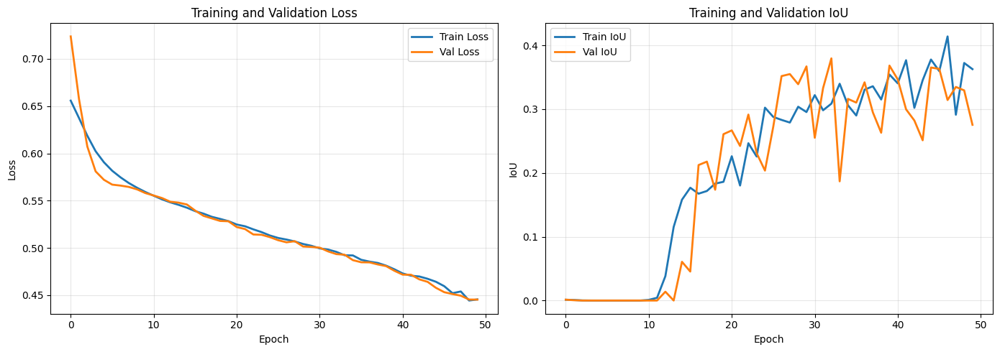

Final metrics:
  Train IoU: 0.3627
  Val IoU: 0.2754
  Best Val IoU: 0.3796


In [14]:
import matplotlib.pyplot as plt

# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss plot
axes[0].plot(history['train_loss'], label='Train Loss', linewidth=2)
axes[0].plot(history['val_loss'], label='Val Loss', linewidth=2)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training and Validation Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# IoU plot
axes[1].plot(history['train_iou'], label='Train IoU', linewidth=2)
axes[1].plot(history['val_iou'], label='Val IoU', linewidth=2)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('IoU')
axes[1].set_title('Training and Validation IoU')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(results_path / 'training_history.png', dpi=150)
plt.show()

print(f"Final metrics:")
print(f"  Train IoU: {history['train_iou'][-1]:.4f}")
print(f"  Val IoU: {history['val_iou'][-1]:.4f}")
print(f"  Best Val IoU: {best_val_iou:.4f}")

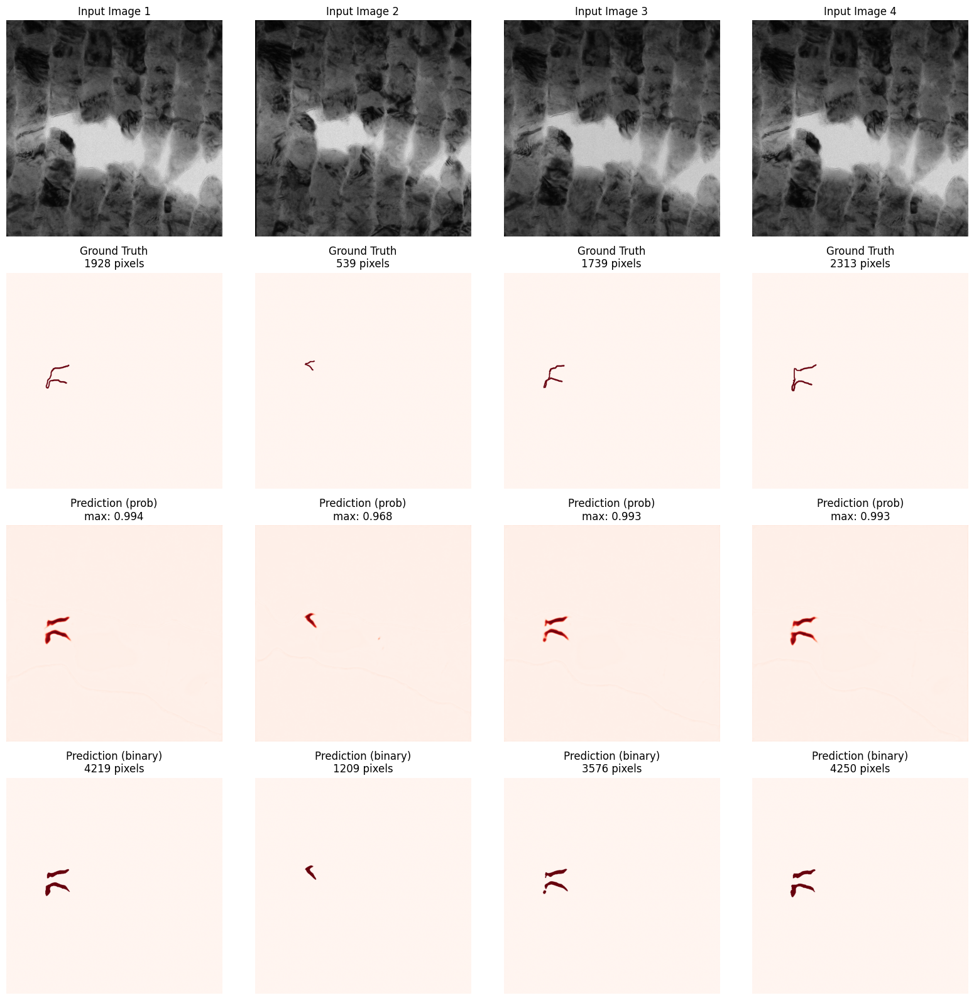

Look at the predictions:
  - Row 2: Ground truth (your annotations)
  - Row 3: Model's probability map (0-1)
  - Row 4: Binary prediction (threshold 0.5)


In [15]:
# Load best model
checkpoint = torch.load(results_path / f'{sample_name}_best_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# Get validation samples
val_images, val_masks = next(iter(val_loader))
val_images = val_images.to(device)

with torch.no_grad():
    predictions = torch.sigmoid(model(val_images))
    predictions_binary = (predictions > 0.5).float()  # Threshold at 0.5

# Visualize
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for i in range(min(4, len(val_images))):
    # Original image
    axes[0, i].imshow(val_images[i, 0].cpu().numpy(), cmap='gray')
    axes[0, i].set_title(f'Input Image {i+1}')
    axes[0, i].axis('off')

    # Ground truth
    gt = val_masks[i, 0].cpu().numpy()
    axes[1, i].imshow(gt, cmap='Reds')
    axes[1, i].set_title(f'Ground Truth\n{gt.sum():.0f} pixels')
    axes[1, i].axis('off')

    # Prediction (probability)
    pred = predictions[i, 0].cpu().numpy()
    axes[2, i].imshow(pred, cmap='Reds', vmin=0, vmax=1)
    axes[2, i].set_title(f'Prediction (prob)\nmax: {pred.max():.3f}')
    axes[2, i].axis('off')

    # Prediction (binary)
    pred_bin = predictions_binary[i, 0].cpu().numpy()
    axes[3, i].imshow(pred_bin, cmap='Reds')
    axes[3, i].set_title(f'Prediction (binary)\n{pred_bin.sum():.0f} pixels')
    axes[3, i].axis('off')

plt.tight_layout()
plt.savefig(results_path / 'current_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

print("Look at the predictions:")
print("  - Row 2: Ground truth (your annotations)")
print("  - Row 3: Model's probability map (0-1)")
print("  - Row 4: Binary prediction (threshold 0.5)")

In [17]:
# Find optimal threshold on validation set
from sklearn.metrics import f1_score
import numpy as np

def find_optimal_threshold(model, val_loader, device):
    """Find threshold that maximizes IoU"""
    model.eval()

    all_preds = []
    all_targets = []

    with torch.no_grad():
        for images, masks in val_loader:
            images = images.to(device)
            outputs = torch.sigmoid(model(images))

            all_preds.append(outputs.cpu().numpy())
            all_targets.append(masks.cpu().numpy())

    all_preds = np.concatenate(all_preds, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)

    # Test different thresholds
    thresholds = np.arange(0.1, 0.9, 0.05)
    best_iou = 0
    best_threshold = 0.5

    print("Testing thresholds...")
    for thresh in thresholds:
        pred_binary = (all_preds > thresh).astype(np.float32)

        intersection = (pred_binary * all_targets).sum()
        union = pred_binary.sum() + all_targets.sum() - intersection
        iou = intersection / (union + 1e-6)

        print(f"  Threshold {thresh:.2f}: IoU = {iou:.4f}")

        if iou > best_iou:
            best_iou = iou
            best_threshold = thresh

    print(f"\n✅ Optimal threshold: {best_threshold:.2f}")
    print(f"   Best IoU: {best_iou:.4f}")

    return best_threshold, best_iou

# Find optimal threshold
optimal_threshold, optimal_iou = find_optimal_threshold(model, val_loader, device)

Testing thresholds...
  Threshold 0.10: IoU = 0.2049
  Threshold 0.15: IoU = 0.3051
  Threshold 0.20: IoU = 0.3270
  Threshold 0.25: IoU = 0.3412
  Threshold 0.30: IoU = 0.3510
  Threshold 0.35: IoU = 0.3602
  Threshold 0.40: IoU = 0.3668
  Threshold 0.45: IoU = 0.3733
  Threshold 0.50: IoU = 0.3800
  Threshold 0.55: IoU = 0.3865
  Threshold 0.60: IoU = 0.3925
  Threshold 0.65: IoU = 0.3987
  Threshold 0.70: IoU = 0.4054
  Threshold 0.75: IoU = 0.4118
  Threshold 0.80: IoU = 0.4172
  Threshold 0.85: IoU = 0.4070

✅ Optimal threshold: 0.80
   Best IoU: 0.4172


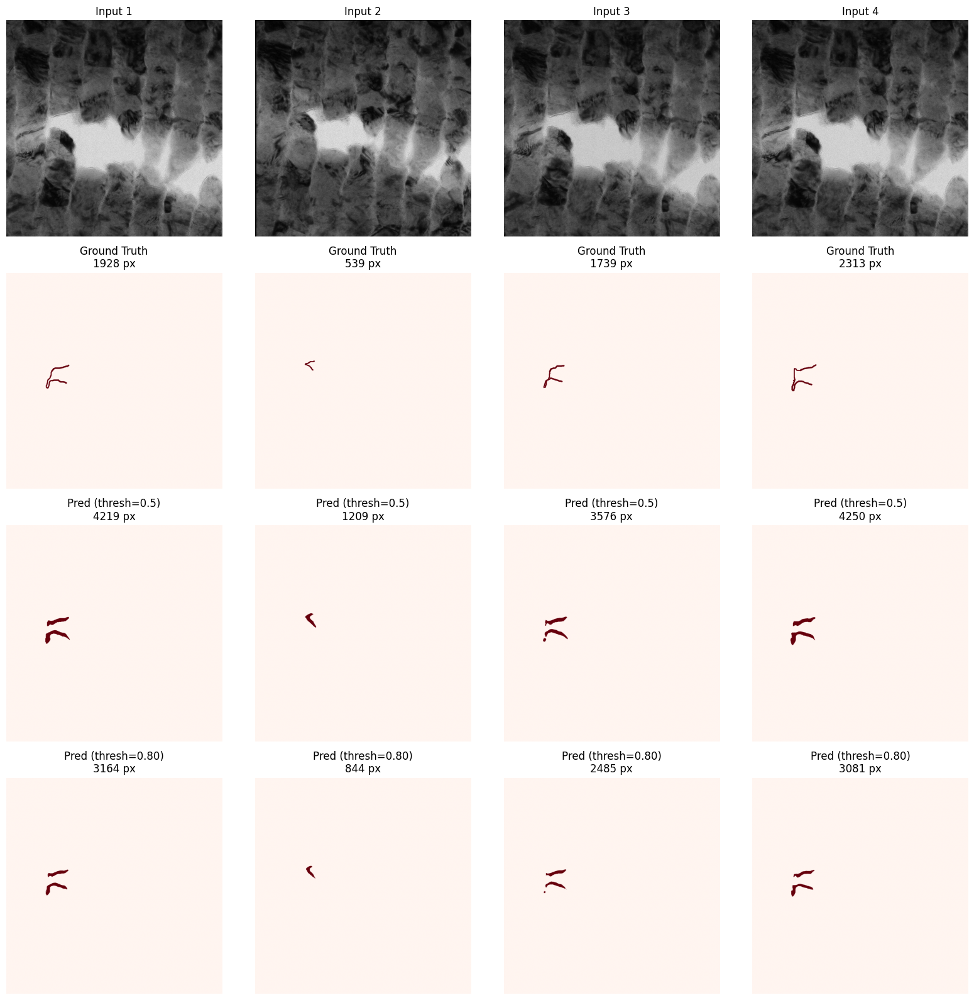

In [18]:
# Re-visualize with optimal threshold
val_images, val_masks = next(iter(val_loader))
val_images = val_images.to(device)

with torch.no_grad():
    predictions = torch.sigmoid(model(val_images))
    predictions_optimal = (predictions > optimal_threshold).float()

fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for i in range(min(4, len(val_images))):
    # Original
    axes[0, i].imshow(val_images[i, 0].cpu().numpy(), cmap='gray')
    axes[0, i].set_title(f'Input {i+1}')
    axes[0, i].axis('off')

    # Ground truth
    gt = val_masks[i, 0].cpu().numpy()
    axes[1, i].imshow(gt, cmap='Reds')
    axes[1, i].set_title(f'Ground Truth\n{gt.sum():.0f} px')
    axes[1, i].axis('off')

    # Prediction with threshold=0.5
    pred_05 = (predictions[i, 0] > 0.5).float().cpu().numpy()
    axes[2, i].imshow(pred_05, cmap='Reds')
    axes[2, i].set_title(f'Pred (thresh=0.5)\n{pred_05.sum():.0f} px')
    axes[2, i].axis('off')

    # Prediction with optimal threshold
    pred_opt = predictions_optimal[i, 0].cpu().numpy()
    axes[3, i].imshow(pred_opt, cmap='Reds')
    axes[3, i].set_title(f'Pred (thresh={optimal_threshold:.2f})\n{pred_opt.sum():.0f} px')
    axes[3, i].axis('off')

plt.tight_layout()
plt.savefig(results_path / 'predictions_with_optimal_threshold.png', dpi=150)
plt.show()

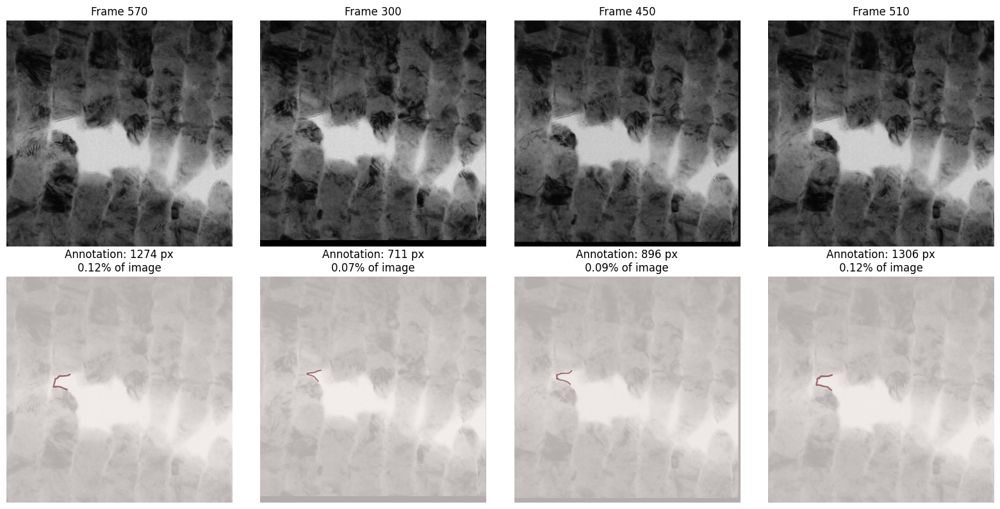

Annotation statistics:
  Mean size: 1093 pixels
  Median size: 1101 pixels
  Min size: 452 pixels
  Max size: 2313 pixels
  Std: 527 pixels


In [19]:
# Check if annotations are actually broad or if there's an issue
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Look at ground truth sizes
for i in range(4):
    idx = train_idx[i * 5]  # Sample from training set

    frame_num = frame_indices[idx]
    image = frames[frame_num]
    mask = masks[idx]

    # Show image
    axes[0, i].imshow(image, cmap='gray')
    axes[0, i].set_title(f'Frame {frame_num}')
    axes[0, i].axis('off')

    # Show mask with counts
    axes[1, i].imshow(image, cmap='gray', alpha=0.6)
    axes[1, i].imshow(mask, cmap='Reds', alpha=0.5)
    axes[1, i].set_title(f'Annotation: {mask.sum():.0f} px\n{mask.sum() / (mask.shape[0] * mask.shape[1]) * 100:.2f}% of image')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

# Statistics
mask_sizes = [masks[i].sum() for i in range(len(masks))]
print(f"Annotation statistics:")
print(f"  Mean size: {np.mean(mask_sizes):.0f} pixels")
print(f"  Median size: {np.median(mask_sizes):.0f} pixels")
print(f"  Min size: {np.min(mask_sizes):.0f} pixels")
print(f"  Max size: {np.max(mask_sizes):.0f} pixels")
print(f"  Std: {np.std(mask_sizes):.0f} pixels")

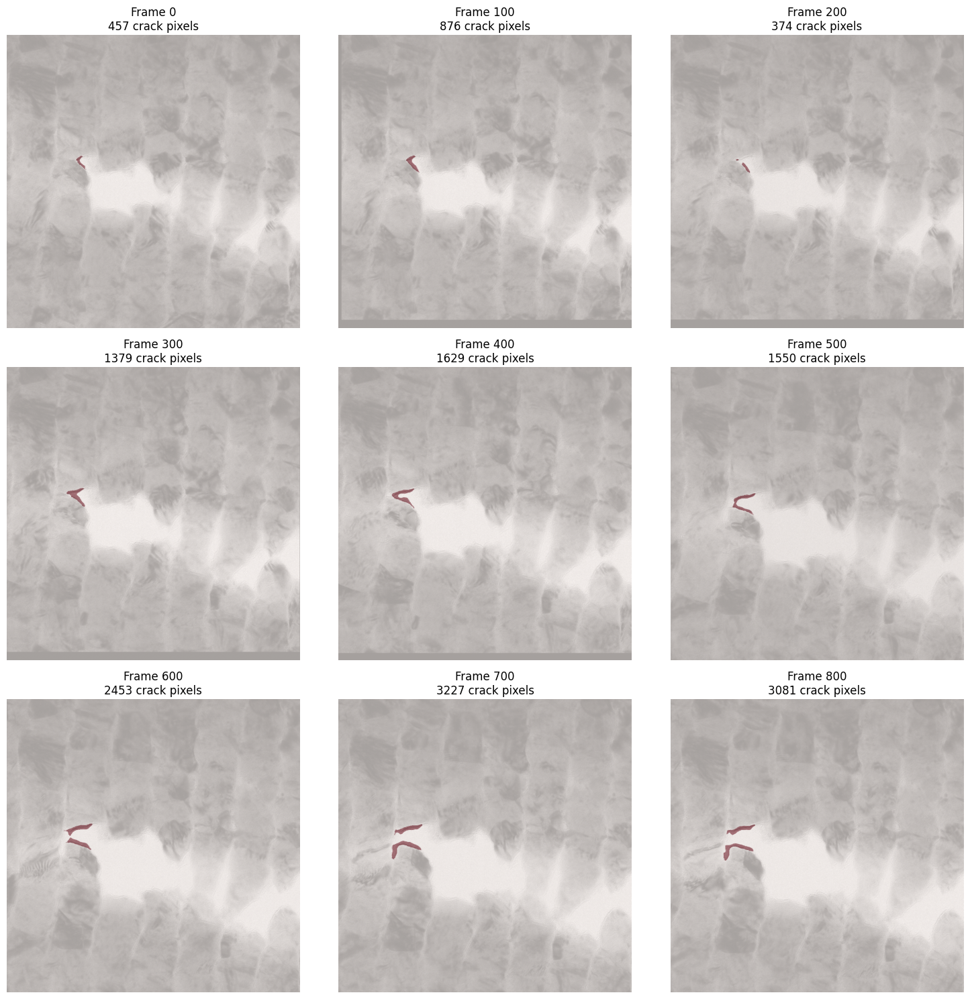

Check if predictions make sense:
  - Does it track the crack?
  - Does it grow as crack propagates?
  - Does it handle blunt regions?


In [20]:
# Predict on a few frames from original sequence
test_frames_idx = [0, 100, 200, 300, 400, 500, 600, 700, 800]  # Spread across all 855

model.eval()
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for i, frame_idx in enumerate(test_frames_idx):
    ax = axes.flat[i]

    # Get frame
    frame = frames[frame_idx].astype(np.float32)
    frame_norm = (frame - frame.min()) / (frame.max() - frame.min() + 1e-8)
    frame_norm = np.expand_dims(frame_norm, axis=(0, -1))  # Add batch and channel

    # Predict
    frame_tensor = torch.from_numpy(frame_norm).permute(0, 3, 1, 2).float().to(device)

    with torch.no_grad():
        pred = torch.sigmoid(model(frame_tensor))
        pred_binary = (pred > 0.80).float()  # Use optimal threshold

    # Visualize
    pred_np = pred_binary[0, 0].cpu().numpy()

    ax.imshow(frame, cmap='gray', alpha=0.7)
    ax.imshow(pred_np, cmap='Reds', alpha=0.5)
    ax.set_title(f'Frame {frame_idx}\n{pred_np.sum():.0f} crack pixels')
    ax.axis('off')

plt.tight_layout()
plt.savefig(results_path / 'inference_test_various_frames.png', dpi=150)
plt.show()

print("Check if predictions make sense:")
print("  - Does it track the crack?")
print("  - Does it grow as crack propagates?")
print("  - Does it handle blunt regions?")

In [21]:
def predict_and_postprocess(model, frame, threshold=0.80, fill_holes=True):
    """
    Predict crack mask with optional post-processing
    """
    # Normalize frame
    frame_norm = (frame - frame.min()) / (frame.max() - frame.min() + 1e-8)
    frame_tensor = torch.from_numpy(frame_norm).float().unsqueeze(0).unsqueeze(0).to(device)

    # Predict
    with torch.no_grad():
        pred = torch.sigmoid(model(frame_tensor))
        pred_binary = (pred > threshold).float()[0, 0].cpu().numpy()

    # Post-process
    if fill_holes:
        pred_binary = binary_fill_holes(pred_binary).astype(np.uint8)

    return pred_binary

In [22]:
# Find rightmost crack pixel
crack_pixels = np.where(mask > 0)
if len(crack_pixels[0]) > 0:
    tip_x = crack_pixels[1].max()  # Rightmost x
    tip_y_indices = crack_pixels[0][crack_pixels[1] == tip_x]
    tip_y = tip_y_indices.mean()  # Average y at tip

In [23]:
# Measure width at fixed distance behind tip
measure_distance = 30  # pixels behind tip
measure_x = tip_x - measure_distance

# Find crack pixels at this x
column = mask[:, measure_x]
crack_y = np.where(column > 0)[0]

if len(crack_y) > 0:
    ctod = crack_y.max() - crack_y.min()  # Distance between surfaces

In [24]:
# Distance from leftmost to rightmost crack pixel
crack_pixels = np.where(mask > 0)
if len(crack_pixels[1]) > 0:
    crack_length = crack_pixels[1].max() - crack_pixels[1].min()

In [25]:
from tqdm.notebook import tqdm
from scipy.ndimage import binary_fill_holes
import time

print("🚀 Running inference on all 855 frames...")
print("="*60)

# Inference settings
threshold = 0.80
fill_holes = True  # Post-process to connect crack surfaces

# Storage
all_predictions = np.zeros((len(frames), frames.shape[1], frames.shape[2]), dtype=np.uint8)

# Batch inference for speed
batch_size = 8
num_batches = (len(frames) + batch_size - 1) // batch_size

model.eval()
start_time = time.time()

with torch.no_grad():
    for batch_idx in tqdm(range(num_batches), desc="Inference"):
        start_idx = batch_idx * batch_size
        end_idx = min(start_idx + batch_size, len(frames))

        # Prepare batch
        batch_frames = []
        for i in range(start_idx, end_idx):
            frame = frames[i].astype(np.float32)
            frame_norm = (frame - frame.min()) / (frame.max() - frame.min() + 1e-8)
            batch_frames.append(frame_norm)

        batch_tensor = torch.from_numpy(np.array(batch_frames)).unsqueeze(1).float().to(device)

        # Predict
        predictions = torch.sigmoid(model(batch_tensor))
        predictions_binary = (predictions > threshold).cpu().numpy()

        # Post-process and store
        for i, pred in enumerate(predictions_binary):
            mask = pred[0]
            if fill_holes:
                mask = binary_fill_holes(mask).astype(np.uint8)
            all_predictions[start_idx + i] = mask

elapsed = time.time() - start_time

print("\n" + "="*60)
print(f"✅ Inference complete!")
print(f"   Time: {elapsed:.1f} seconds ({elapsed/len(frames):.3f} sec/frame)")
print(f"   Speed: {len(frames)/elapsed:.1f} frames/second")
print(f"   Total frames: {len(frames)}")
print("="*60)

# Save predictions
np.save(results_path / f'{sample_name}_all_predictions.npy', all_predictions)
print(f"\n💾 Saved predictions to: {results_path / f'{sample_name}_all_predictions.npy'}")

🚀 Running inference on all 855 frames...


Inference:   0%|          | 0/107 [00:00<?, ?it/s]


✅ Inference complete!
   Time: 137.1 seconds (0.160 sec/frame)
   Speed: 6.2 frames/second
   Total frames: 855

💾 Saved predictions to: /content/drive/MyDrive/Crack_tracking/results/1508_20250613_105_kx_Ceta_Camera_all_predictions.npy


In [26]:
from skimage import measure
from scipy.optimize import least_squares

def extract_crack_measurements(mask):
    """
    Extract comprehensive crack measurements from binary mask

    Returns dictionary with:
    - tip_position: (y, x) coordinates
    - crack_length: contour length
    - crack_width: maximum width
    - ctod: crack tip opening displacement
    - tip_radius: crack tip bluntness
    - crack_area: total crack area
    """

    if mask.sum() == 0:
        return None

    # Get crack pixels
    crack_coords = np.where(mask > 0)

    if len(crack_coords[0]) == 0:
        return None

    measurements = {}

    # 1. Crack tip position (rightmost point)
    tip_x = crack_coords[1].max()
    tip_y_candidates = crack_coords[0][crack_coords[1] == tip_x]
    tip_y = int(np.mean(tip_y_candidates))
    measurements['tip_x'] = tip_x
    measurements['tip_y'] = tip_y
    measurements['tip_position'] = (tip_y, tip_x)

    # 2. Crack length (horizontal extent)
    measurements['crack_length'] = crack_coords[1].max() - crack_coords[1].min()

    # 3. Crack area
    measurements['crack_area'] = mask.sum()

    # 4. CTOD - measure at multiple distances behind tip
    ctod_distances = [10, 20, 30, 40, 50]  # pixels behind tip
    ctods = {}

    for dist in ctod_distances:
        measure_x = tip_x - dist
        if measure_x >= 0 and measure_x < mask.shape[1]:
            column = mask[:, measure_x]
            crack_y = np.where(column > 0)[0]
            if len(crack_y) > 0:
                ctods[f'ctod_{dist}px'] = crack_y.max() - crack_y.min()
            else:
                ctods[f'ctod_{dist}px'] = 0
        else:
            ctods[f'ctod_{dist}px'] = 0

    measurements.update(ctods)

    # Use CTOD at 20px as primary measure
    measurements['ctod'] = ctods['ctod_20px']

    # 5. Crack width (maximum vertical extent)
    measurements['crack_width'] = crack_coords[0].max() - crack_coords[0].min()

    # 6. Tip radius (measure of bluntness)
    # Extract region around tip for curvature fitting
    tip_region_size = 30
    y_min = max(0, tip_y - tip_region_size)
    y_max = min(mask.shape[0], tip_y + tip_region_size)
    x_min = max(0, tip_x - tip_region_size)
    x_max = min(mask.shape[1], tip_x)

    tip_region = mask[y_min:y_max, x_min:x_max]

    # Find contour in tip region
    contours = measure.find_contours(tip_region, 0.5)

    if len(contours) > 0:
        # Get the contour closest to tip
        contour = max(contours, key=len)

        # Fit circle to estimate tip radius
        if len(contour) > 5:
            def circle_residuals(params, points):
                cy, cx, r = params
                return np.sqrt((points[:, 0] - cy)**2 + (points[:, 1] - cx)**2) - r

            # Initial guess
            center_y, center_x = contour.mean(axis=0)
            initial_r = 5

            try:
                result = least_squares(
                    circle_residuals,
                    [center_y, center_x, initial_r],
                    args=(contour,),
                    bounds=([0, 0, 1], [tip_region.shape[0], tip_region.shape[1], 50])
                )
                measurements['tip_radius'] = abs(result.x[2])
            except:
                measurements['tip_radius'] = np.nan
        else:
            measurements['tip_radius'] = np.nan
    else:
        measurements['tip_radius'] = np.nan

    return measurements

# Extract measurements from all frames
print("📏 Extracting measurements from all frames...")
print("="*60)

all_measurements = []

for frame_idx in tqdm(range(len(all_predictions)), desc="Extracting measurements"):
    mask = all_predictions[frame_idx]
    measurements = extract_crack_measurements(mask)

    if measurements is not None:
        measurements['frame'] = frame_idx
        all_measurements.append(measurements)

# Convert to DataFrame
import pandas as pd
df_measurements = pd.DataFrame(all_measurements)

print("\n" + "="*60)
print(f"✅ Measurements extracted!")
print(f"   Total frames with cracks: {len(df_measurements)}")
print(f"   Measurements per frame: {len(df_measurements.columns)}")
print("="*60)

# Display summary statistics
print("\n📊 Summary Statistics:")
print(df_measurements[['crack_length', 'crack_area', 'ctod', 'tip_radius', 'crack_width']].describe())

# Save measurements
csv_path = results_path / f'{sample_name}_measurements.csv'
df_measurements.to_csv(csv_path, index=False)
print(f"\n💾 Saved measurements to: {csv_path}")

📏 Extracting measurements from all frames...


Extracting measurements:   0%|          | 0/855 [00:00<?, ?it/s]


✅ Measurements extracted!
   Total frames with cracks: 850
   Measurements per frame: 14

📊 Summary Statistics:
       crack_length   crack_area        ctod  tip_radius  crack_width
count    850.000000   850.000000  850.000000  850.000000   850.000000
mean      77.355294  1794.330588   60.062353   25.651094    82.910588
std       24.887892   846.459868   18.033332    7.434082    24.880378
min       33.000000   104.000000    0.000000    4.474386    46.000000
25%       54.000000  1005.250000   46.000000   24.173902    64.000000
50%       79.500000  1716.500000   54.000000   26.542530    72.500000
75%      103.750000  2437.750000   79.000000   29.359390   110.000000
max      116.000000  3741.000000   90.000000   44.305781   129.000000

💾 Saved measurements to: /content/drive/MyDrive/Crack_tracking/results/1508_20250613_105_kx_Ceta_Camera_measurements.csv


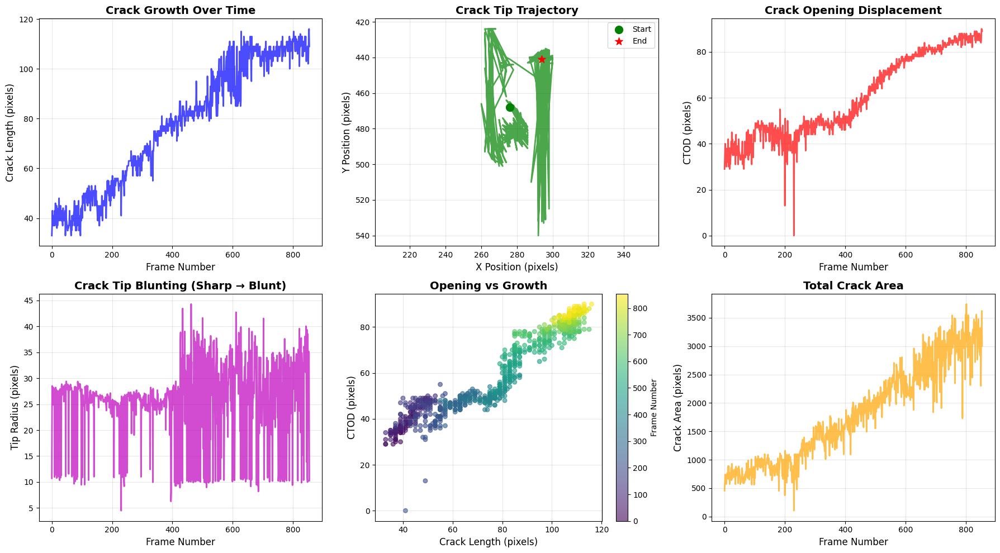

✅ Temporal evolution plots saved!


In [27]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Crack Growth (Length)
axes[0, 0].plot(df_measurements['frame'], df_measurements['crack_length'],
                'b-', linewidth=2, alpha=0.7)
axes[0, 0].set_xlabel('Frame Number', fontsize=12)
axes[0, 0].set_ylabel('Crack Length (pixels)', fontsize=12)
axes[0, 0].set_title('Crack Growth Over Time', fontsize=14, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

# 2. Crack Tip Position (Trajectory)
axes[0, 1].plot(df_measurements['tip_x'], df_measurements['tip_y'],
                'g-', linewidth=2, alpha=0.7)
axes[0, 1].scatter(df_measurements['tip_x'].iloc[0], df_measurements['tip_y'].iloc[0],
                   c='green', s=100, marker='o', label='Start', zorder=5)
axes[0, 1].scatter(df_measurements['tip_x'].iloc[-1], df_measurements['tip_y'].iloc[-1],
                   c='red', s=100, marker='*', label='End', zorder=5)
axes[0, 1].set_xlabel('X Position (pixels)', fontsize=12)
axes[0, 1].set_ylabel('Y Position (pixels)', fontsize=12)
axes[0, 1].set_title('Crack Tip Trajectory', fontsize=14, fontweight='bold')
axes[0, 1].invert_yaxis()
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].axis('equal')

# 3. Crack Tip Opening Displacement (CTOD)
axes[0, 2].plot(df_measurements['frame'], df_measurements['ctod'],
                'r-', linewidth=2, alpha=0.7)
axes[0, 2].set_xlabel('Frame Number', fontsize=12)
axes[0, 2].set_ylabel('CTOD (pixels)', fontsize=12)
axes[0, 2].set_title('Crack Opening Displacement', fontsize=14, fontweight='bold')
axes[0, 2].grid(True, alpha=0.3)

# 4. Tip Radius (Blunting)
# Filter out NaN values
df_valid_radius = df_measurements[df_measurements['tip_radius'].notna()]
axes[1, 0].plot(df_valid_radius['frame'], df_valid_radius['tip_radius'],
                'm-', linewidth=2, alpha=0.7)
axes[1, 0].set_xlabel('Frame Number', fontsize=12)
axes[1, 0].set_ylabel('Tip Radius (pixels)', fontsize=12)
axes[1, 0].set_title('Crack Tip Blunting (Sharp → Blunt)', fontsize=14, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# 5. CTOD vs Crack Length
axes[1, 1].scatter(df_measurements['crack_length'], df_measurements['ctod'],
                   c=df_measurements['frame'], cmap='viridis', s=30, alpha=0.6)
axes[1, 1].set_xlabel('Crack Length (pixels)', fontsize=12)
axes[1, 1].set_ylabel('CTOD (pixels)', fontsize=12)
axes[1, 1].set_title('Opening vs Growth', fontsize=14, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)
cbar = plt.colorbar(axes[1, 1].collections[0], ax=axes[1, 1])
cbar.set_label('Frame Number', fontsize=10)

# 6. Crack Area
axes[1, 2].plot(df_measurements['frame'], df_measurements['crack_area'],
                'orange', linewidth=2, alpha=0.7)
axes[1, 2].set_xlabel('Frame Number', fontsize=12)
axes[1, 2].set_ylabel('Crack Area (pixels)', fontsize=12)
axes[1, 2].set_title('Total Crack Area', fontsize=14, fontweight='bold')
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(results_path / f'{sample_name}_temporal_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Temporal evolution plots saved!")

In [28]:
# Analyze key events
print("\n" + "="*60)
print("🔍 Key Events Analysis:")
print("="*60)

# Find when crack starts growing significantly
initial_length = df_measurements['crack_length'].iloc[:10].mean()
significant_growth = df_measurements[df_measurements['crack_length'] > initial_length * 1.5]

if len(significant_growth) > 0:
    growth_start_frame = significant_growth.iloc[0]['frame']
    print(f"\n📈 Significant crack growth starts at Frame {growth_start_frame:.0f}")

# Find maximum blunting
if len(df_valid_radius) > 0:
    max_blunting_idx = df_valid_radius['tip_radius'].idxmax()
    max_blunting_frame = df_valid_radius.loc[max_blunting_idx, 'frame']
    max_radius = df_valid_radius.loc[max_blunting_idx, 'tip_radius']
    print(f"🔵 Maximum blunting at Frame {max_blunting_frame:.0f} (radius: {max_radius:.1f} px)")

# Find maximum CTOD
max_ctod_idx = df_measurements['ctod'].idxmax()
max_ctod_frame = df_measurements.loc[max_ctod_idx, 'frame']
max_ctod = df_measurements.loc[max_ctod_idx, 'ctod']
print(f"↕️  Maximum CTOD at Frame {max_ctod_frame:.0f} (opening: {max_ctod:.1f} px)")

# Calculate growth rate (change in length per frame)
df_measurements['growth_rate'] = df_measurements['crack_length'].diff()
avg_growth_rate = df_measurements['growth_rate'].mean()
print(f"⚡ Average growth rate: {avg_growth_rate:.2f} pixels/frame")

# Find phases
if len(df_measurements) > 100:
    # Assume sharp phase is first 1/3, transition is middle 1/3, blunt is last 1/3
    n = len(df_measurements)
    sharp_phase = df_measurements.iloc[:n//3]
    transition_phase = df_measurements.iloc[n//3:2*n//3]
    blunt_phase = df_measurements.iloc[2*n//3:]

    print(f"\n📊 Phase Analysis:")
    print(f"   Sharp phase (frames 0-{n//3}):")
    print(f"      Avg CTOD: {sharp_phase['ctod'].mean():.1f} px")
    print(f"      Avg tip radius: {sharp_phase['tip_radius'].mean():.1f} px")

    print(f"   Transition phase (frames {n//3}-{2*n//3}):")
    print(f"      Avg CTOD: {transition_phase['ctod'].mean():.1f} px")
    print(f"      Avg tip radius: {transition_phase['tip_radius'].mean():.1f} px")

    print(f"   Blunt phase (frames {2*n//3}-{n}):")
    print(f"      Avg CTOD: {blunt_phase['ctod'].mean():.1f} px")
    print(f"      Avg tip radius: {blunt_phase['tip_radius'].mean():.1f} px")

print("="*60)


🔍 Key Events Analysis:

📈 Significant crack growth starts at Frame 235
🔵 Maximum blunting at Frame 462 (radius: 44.3 px)
↕️  Maximum CTOD at Frame 852 (opening: 90.0 px)
⚡ Average growth rate: 0.09 pixels/frame

📊 Phase Analysis:
   Sharp phase (frames 0-283):
      Avg CTOD: 41.3 px
      Avg tip radius: 24.6 px
   Transition phase (frames 283-566):
      Avg CTOD: 56.8 px
      Avg tip radius: 25.8 px
   Blunt phase (frames 566-850):
      Avg CTOD: 81.9 px
      Avg tip radius: 26.5 px



🎥 Creating visualization of crack evolution...


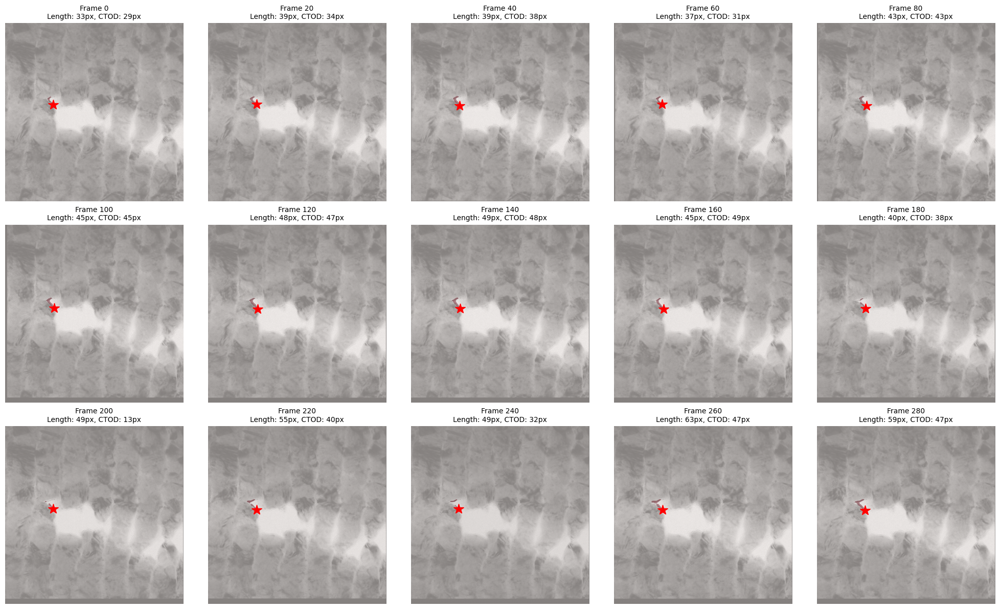

✅ Visualization complete!


In [29]:
# Create a video showing crack evolution with overlay
print("\n🎥 Creating visualization of crack evolution...")

# Select frames to show (every 20th frame)
vis_frames = list(range(0, len(frames), 20))

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

for idx, frame_num in enumerate(vis_frames[:15]):  # Show 15 frames
    if idx >= len(axes):
        break

    frame = frames[frame_num]
    mask = all_predictions[frame_num]

    # Get measurements for this frame
    frame_data = df_measurements[df_measurements['frame'] == frame_num]

    # Overlay
    axes[idx].imshow(frame, cmap='gray', alpha=0.8)
    axes[idx].imshow(mask, cmap='Reds', alpha=0.4)

    # Mark tip
    if len(frame_data) > 0:
        tip_x = frame_data.iloc[0]['tip_x']
        tip_y = frame_data.iloc[0]['tip_y']
        axes[idx].plot(tip_x, tip_y, 'r*', markersize=15)

        # Add info
        length = frame_data.iloc[0]['crack_length']
        ctod = frame_data.iloc[0]['ctod']
        axes[idx].set_title(f'Frame {frame_num}\nLength: {length:.0f}px, CTOD: {ctod:.0f}px',
                           fontsize=10)
    else:
        axes[idx].set_title(f'Frame {frame_num}', fontsize=10)

    axes[idx].axis('off')

plt.tight_layout()
plt.savefig(results_path / f'{sample_name}_evolution_montage.png', dpi=200, bbox_inches='tight')
plt.show()

print("✅ Visualization complete!")

In [30]:
print("\n" + "="*60)
print("🎉 DAY 1 COMPLETE - SUMMARY")
print("="*60)
print(f"\n📁 Files created:")
print(f"   1. {sample_name}_all_predictions.npy - Segmentation masks (855 frames)")
print(f"   2. {sample_name}_measurements.csv - All measurements")
print(f"   3. {sample_name}_temporal_analysis.png - Evolution plots")
print(f"   4. {sample_name}_evolution_montage.png - Visual summary")
print(f"   5. {sample_name}_best_model_v2.pth - Trained model (if retrained)")

print(f"\n📊 Measurements extracted:")
print(f"   - Crack tip position (x, y)")
print(f"   - Crack length")
print(f"   - CTOD (at multiple distances)")
print(f"   - Tip radius (bluntness)")
print(f"   - Crack area")
print(f"   - Crack width")

print(f"\n✅ Ready for:")
print(f"   - Compare with other samples (30nm, 60nm, 120nm)")
print(f"   - Physical interpretation")
print(f"   - Hackathon presentation")

print("\n" + "="*60)
print("⏱️  Time for Day 2: Comparative analysis & presentation!")
print("="*60)


🎉 DAY 1 COMPLETE - SUMMARY

📁 Files created:
   1. 1508_20250613_105_kx_Ceta_Camera_all_predictions.npy - Segmentation masks (855 frames)
   2. 1508_20250613_105_kx_Ceta_Camera_measurements.csv - All measurements
   3. 1508_20250613_105_kx_Ceta_Camera_temporal_analysis.png - Evolution plots
   4. 1508_20250613_105_kx_Ceta_Camera_evolution_montage.png - Visual summary
   5. 1508_20250613_105_kx_Ceta_Camera_best_model_v2.pth - Trained model (if retrained)

📊 Measurements extracted:
   - Crack tip position (x, y)
   - Crack length
   - CTOD (at multiple distances)
   - Tip radius (bluntness)
   - Crack area
   - Crack width

✅ Ready for:
   - Compare with other samples (30nm, 60nm, 120nm)
   - Physical interpretation
   - Hackathon presentation

⏱️  Time for Day 2: Comparative analysis & presentation!
